In [1]:
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle

In [2]:
print(torch.cuda.is_available())

True


In [3]:
# Проверяем, доступны ли GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
# Загрузка DataFrame из файла
with open(r'./datasets/seg_maps_dataset.pkl', 'rb') as f:
    df = pickle.load(f)

In [5]:
df = df.loc[df['Stats'].isin([1.e+08, 2.e+08, 5.e+08])]

df['Stats'].unique()

array([1.e+08, 2.e+08, 5.e+08])

In [ ]:
crystals = np.array(df['Crystal'].unique())

df['Crystal'].unique()

In [6]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

X = df.drop(['Crystal', 'Stats', 'Pulce duration'], axis=1)

# Шаг 1: Преобразование строковых меток классов в числовые метки
label_encoder = LabelEncoder()

Stats = df['Stats']

y = df['Crystal']

y_encoded = label_encoder.fit_transform(y)

Diff_train, Diff_test, Stats_train, Stats_test, y_train, y_test = train_test_split(X, Stats, y_encoded, test_size=0.1, random_state=42)

In [7]:
import torch.nn.functional as F

# Преобразование матриц в numpy массив перед преобразованием в тензоры
Diff_train_matrices = np.array(Diff_train['Matrix'].tolist())
Diff_test_matrices = np.array(Diff_test['Matrix'].tolist())

Stats_train_matrices = np.array(Stats_train.tolist())
Stats_test_matrices = np.array(Stats_test.tolist())

# Преобразование данных в тензоры PyTorch
Diff_train_tensor = torch.FloatTensor(Diff_train_matrices)
Diff_train_tensor = Diff_train_tensor.unsqueeze(1)
#Diff_train_tensor = F.interpolate(Diff_train_tensor, size=(256, 480), mode='bicubic', align_corners=False)
Diff_train_tensor = Diff_train_tensor * 2.0 - 1.0
Stats_train_tensor = torch.FloatTensor(Stats_train_matrices)

y_train_tensor = torch.LongTensor(y_train)  # Используем LongTensor для целевых меток

Diff_test_tensor = torch.FloatTensor(Diff_test_matrices)
Diff_test_tensor = Diff_test_tensor.unsqueeze(1)
#Diff_test_tensor = F.interpolate(Diff_test_tensor, size=(256, 480), mode='bicubic', align_corners=False)
Diff_test_tensor = Diff_test_tensor * 2.0 - 1.0
Stats_test_tensor = torch.FloatTensor(Stats_test_matrices)

y_test_tensor = torch.LongTensor(y_test)

In [8]:
print(Diff_train_tensor.size())
print(Diff_test_tensor.size())

torch.Size([1620, 1, 250, 480])
torch.Size([180, 1, 250, 480])


In [9]:
from torch.utils.data import TensorDataset, DataLoader, random_split

# Создание набора данных
train_dataset = TensorDataset(Diff_train_tensor, y_train_tensor)

test_dataset = TensorDataset(Diff_test_tensor, y_test_tensor)

# Создание DataLoader для каждой выборки
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True)

test_loader = DataLoader(test_dataset, batch_size=10, shuffle=False)

In [ ]:
from Spatial_UnConditional_ViT_VAE_model import ViTVAEForLatentMaps

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Model configuration
VAE = ViTVAEForLatentMaps(img_size=(250, 480), patch_size=(10, 16), in_channels=1,
                 embed_dim=512, depth=6, num_heads=8, mlp_ratio=2.0,
                 latent_channels=256, dropout=0.1).to(device)
VAE.load_state_dict(torch.load("models/ViT_VAE_UnCondition_2d_lattent_space_2.pth"))
VAE.to(device)

# fake batch
data = torch.randn(4, 1, 250, 480, device=device)
labels = torch.randint(0, 20, (4,), device=device)

with torch.no_grad():
    recon_data, mean, logvar = VAE(data)

print(recon_data.size(), mean.size(), logvar.size())

torch.Size([4, 1, 250, 480]) torch.Size([4, 256, 25, 30]) torch.Size([4, 256, 25, 30])


In [ ]:
from Spatial_Conditional_ViT_VAE_model import ViTVAEForLatentMaps

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Model configuration
VAE = ViTVAEForLatentMaps(
    img_size=(250, 480),
    patch_size=(10, 16),  # 25x30 patches
    in_channels=1,
    embed_dim=512,
    depth=6,
    num_heads=8,
    num_classes=30,
    latent_channels=32,
    dropout=0.1
).to(device)

# VAE.load_state_dict(torch.load("models/Conditional_ViT_VAE_for_diffusion_super_clastering.pth"))
VAE.load_state_dict(torch.load("models/Conditional_ViT_VAE_bound_state_fine_tuned.pth"))

<All keys matched successfully>

100%|██████████| 162/162 [00:08<00:00, 18.61it/s]


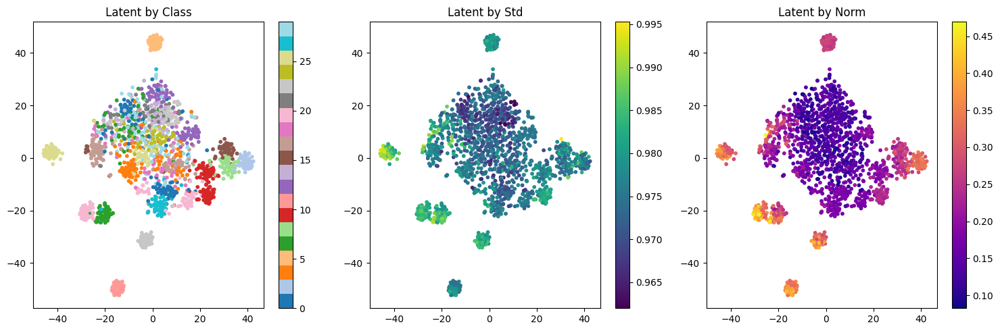

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap
import numpy as np
from tqdm import tqdm
from matplotlib.colors import ListedColormap

def visualize_spatial_latent(model, dataloader, device, method="tsne", class_names=None):

    model.eval()
    all_latents = []
    all_labels = []
    all_stds = []
    all_norms = []

    with torch.no_grad():
        for data, labels in tqdm(dataloader):

            data = data.to(device)
            labels = labels.to(device)

            # Encoder
            z, mu, logvar = model.encode(data, labels)

            # ---- GLOBAL POOLING: reduce spatial map → vector ----
            z_vec     = torch.mean(z, dim=(2,3)).cpu().numpy()          # [B,256]
            mu_vec    = torch.mean(mu, dim=(2,3)).cpu().numpy()         # [B,256]
            logvar_vec = torch.mean(logvar, dim=(2,3)).cpu().numpy()    # [B,256]

            all_latents.append(z_vec)
            all_norms.append(np.linalg.norm(mu_vec, axis=1))
            all_stds.append(np.exp(0.5 * logvar_vec).mean(axis=1))
            all_labels.append(labels.cpu().numpy())

    all_latents = np.vstack(all_latents)
    all_norms   = np.concatenate(all_norms)
    all_stds    = np.concatenate(all_stds)
    all_labels  = np.concatenate(all_labels)

    # --- Dimensionality reduction ---
    if method == "tsne":
        reducer = TSNE(n_components=2, perplexity=30, random_state=42)
    elif method == "umap":
        reducer = umap.UMAP(n_components=2, random_state=42)
    else:
        reducer = PCA(n_components=2)

    lat2d = reducer.fit_transform(all_latents)

    # --- Plots ---
    plt.figure(figsize=(15,5))

    # By class - с названиями классов в colorbar
    plt.subplot(131)
    
    # Получаем уникальные классы и их количество
    unique_labels = np.unique(all_labels)
    n_classes = len(unique_labels)
    
    # Используем дискретную цветовую карту
    # cmap = plt.cm.get_cmap('tab20', n_classes)
    # cmap = plt.cm.get_cmap('gist_ncar', n_classes)

    base_colors = (
        list(plt.cm.tab20.colors) +
        list(plt.cm.tab20b.colors) +
        list(plt.cm.tab20c.colors)
    )

    cmap = ListedColormap(base_colors[:n_classes])
    
    scatter = plt.scatter(lat2d[:,0], lat2d[:,1], 
                         c=all_labels, 
                         cmap=cmap, 
                         s=10,
                         vmin=-0.5, 
                         vmax=n_classes-0.5)
    
    # Создаем colorbar с названиями классов
    cbar = plt.colorbar(scatter, ticks=range(n_classes))
    
    # Если переданы названия классов, используем их
    if class_names is not None:
        # Проверяем, что количество названий соответствует количеству классов
        if len(class_names) >= n_classes:
            cbar.ax.set_yticklabels([class_names[i] for i in range(n_classes)])
        else:
            print(f"Предупреждение: class_names содержит {len(class_names)} элементов, но есть {n_classes} классов")
            # Используем индексы как fallback
            cbar.ax.set_yticklabels([str(i) for i in range(n_classes)])
    else:
        # Если названий нет, используем просто индексы
        cbar.ax.set_yticklabels([str(i) for i in range(n_classes)])
    
    plt.title("Latent by Class")

    # Uncertainty
    plt.subplot(132)
    s = plt.scatter(lat2d[:,0], lat2d[:,1], c=all_stds, cmap="viridis", s=10)
    plt.colorbar(s)
    plt.title("Latent by Std")

    # Norm
    plt.subplot(133)
    s = plt.scatter(lat2d[:,0], lat2d[:,1], c=all_norms, cmap="plasma", s=10)
    plt.colorbar(s)
    plt.title("Latent by Norm")

    plt.tight_layout()
    plt.show()

    return all_latents, all_labels, lat2d

all_latents, all_labels, lat2d = visualize_spatial_latent(VAE, train_loader, device, method="tsne", class_names=crystals)

# Standard diagnostics of the latent space for its parameters

In [ ]:
# Добавьте эту диагностику перед обучением
def diagnose_latent_space(VAE, train_loader, device):
    VAE.eval()
    latent_samples = []
    
    with torch.no_grad():
        for diffractions, classes in tqdm(train_loader):
            diffractions = diffractions.to(device)
            classes = classes.to(device)
            latent_maps, mu, logvar = VAE.encode(diffractions, classes)
            latent_samples.append(latent_maps)
    
    latent_all = torch.cat(latent_samples, dim=0)
    
    print("=== ЛАТЕНТНОЕ ПРОСТРАНСТВО ===")
    print(f"Shape: {latent_all.shape}")
    print(f"Mean: {latent_all.mean().item():.4f}")
    print(f"Std: {latent_all.std().item():.4f}")
    print(f"Min: {latent_all.min().item():.4f}")
    print(f"Max: {latent_all.max().item():.4f}")
    print(f"NaN: {torch.isnan(latent_all).any()}")
    print(f"Inf: {torch.isinf(latent_all).any()}")
    
    # Проверка распределения шума
    noise = torch.randn_like(latent_all)
    print(f"Noise std: {noise.std().item():.4f}")

# Запустите диагностику
diagnose_latent_space(VAE, train_loader, device)

  0%|          | 0/162 [00:00<?, ?it/s]


TypeError: ViTVAEForLatentMaps.encode() missing 1 required positional argument: 'class_labels'

# Reconstruction test

In [12]:
#array([1.e+07, 2.e+07, 5.e+07, 1.e+08, 2.e+08, 5.e+08])
maxStats = 5.e+08
minI = max(df['Pulce duration'].unique())

df_test = df.loc[((df['Stats'] == maxStats) & (df['Pulce duration'] == minI))]
df_test = df_test.reset_index(drop= True)

Crystal_tags = df_test['Crystal']

Crystal_tags_encoded = label_encoder.fit_transform(Crystal_tags)

Crystal_tags_encoded = torch.LongTensor(Crystal_tags_encoded)
Crystal_tags_encoded = Crystal_tags_encoded.to(device)

# Преобразование матриц в numpy массив перед преобразованием в тензоры
df_test_matrices = np.array(df_test['Matrix'].tolist())

# Преобразование данных в тензоры PyTorch
df_test_tensor = torch.FloatTensor(df_test_matrices)
df_test_tensor = df_test_tensor.unsqueeze(1)
df_test_tensor = df_test_tensor * 2.0 - 1.0

df_test_tensor = df_test_tensor.to(device)
print(df_test_tensor.size())
print(Crystal_tags_encoded.size())

df_test_tensor = df_test_tensor.to(device)

torch.Size([30, 1, 250, 480])
torch.Size([30])


Loss: 0.0553, Recon Loss: 0.0384, KL Loss: 0.0169


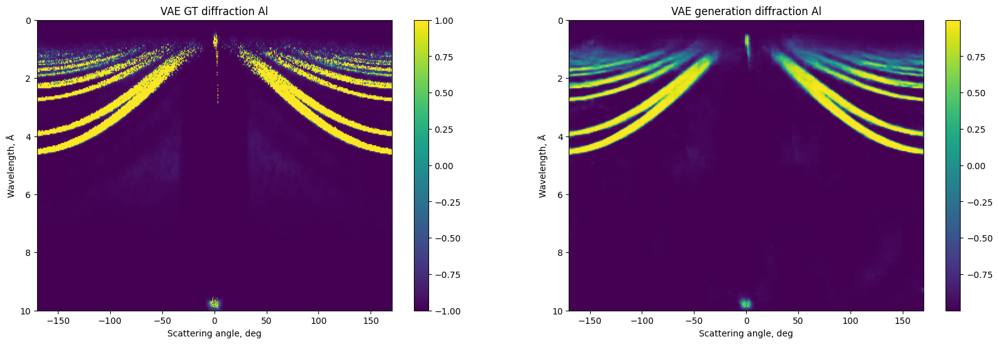

Loss: 0.0939, Recon Loss: 0.0755, KL Loss: 0.0183


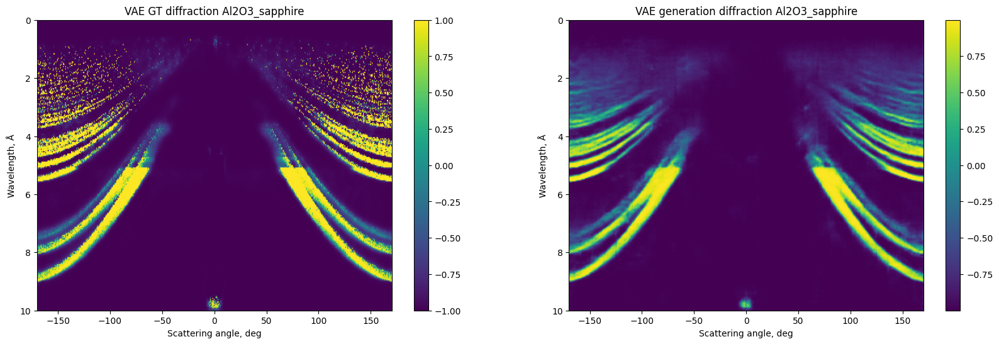

Loss: 0.0299, Recon Loss: 0.0162, KL Loss: 0.0137


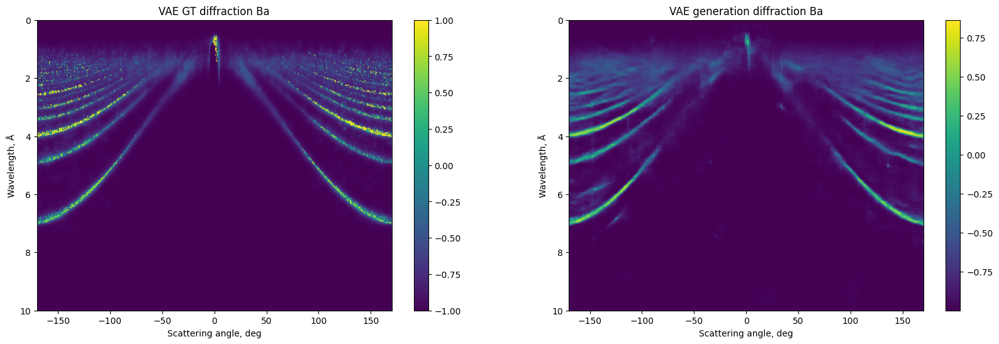

Loss: 0.0443, Recon Loss: 0.0294, KL Loss: 0.0149


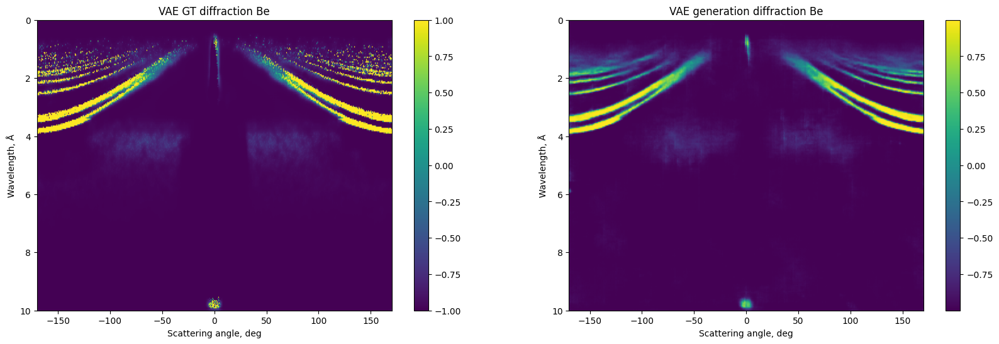

Loss: 0.0746, Recon Loss: 0.0574, KL Loss: 0.0172


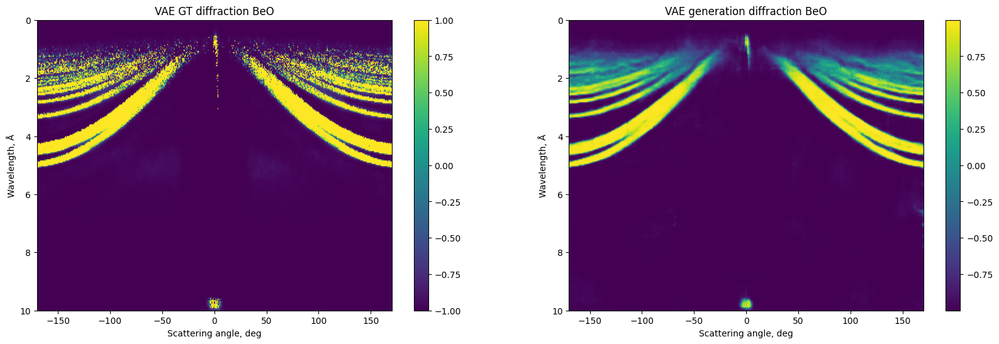

Loss: 0.0288, Recon Loss: 0.0159, KL Loss: 0.0128


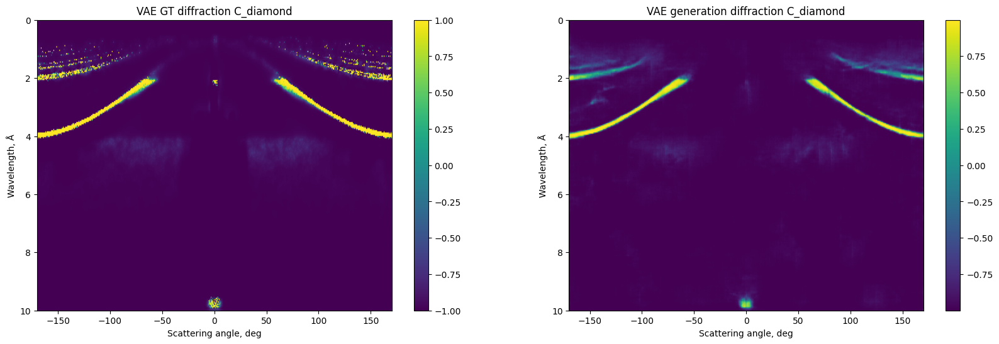

Loss: 0.0704, Recon Loss: 0.0519, KL Loss: 0.0185


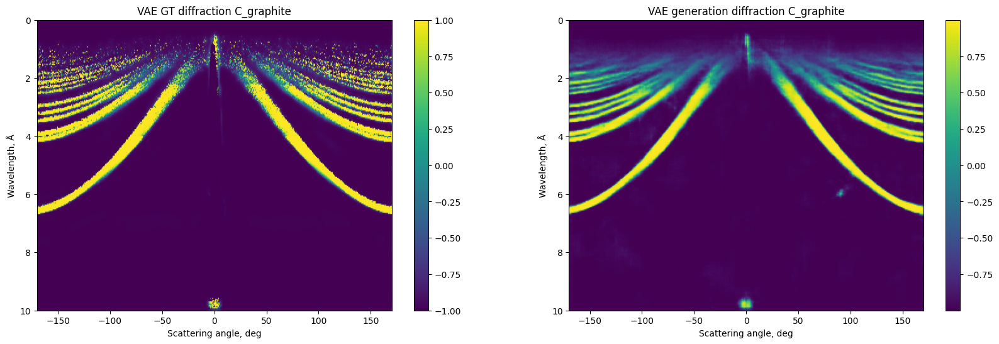

Loss: 0.0646, Recon Loss: 0.0513, KL Loss: 0.0133


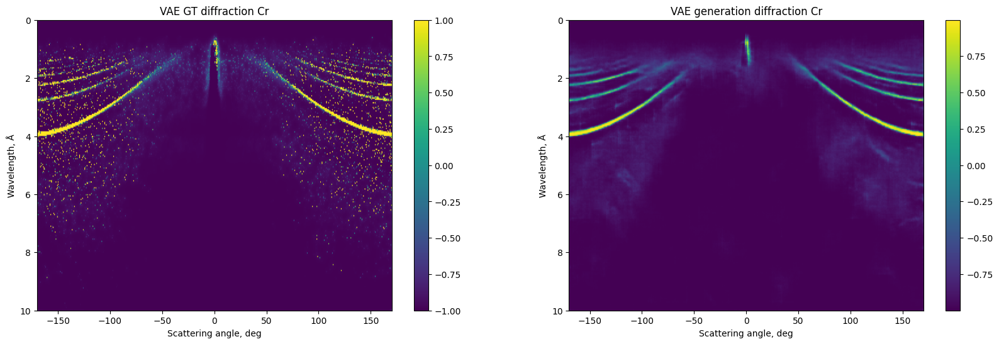

Loss: 0.0337, Recon Loss: 0.0190, KL Loss: 0.0148


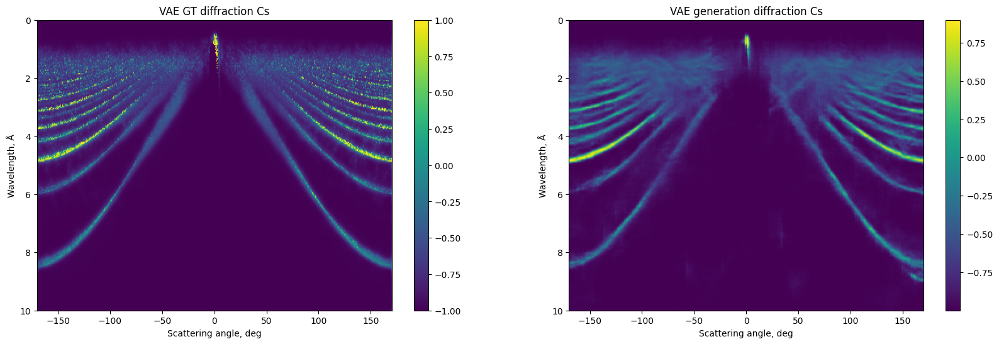

Loss: 0.0446, Recon Loss: 0.0307, KL Loss: 0.0139


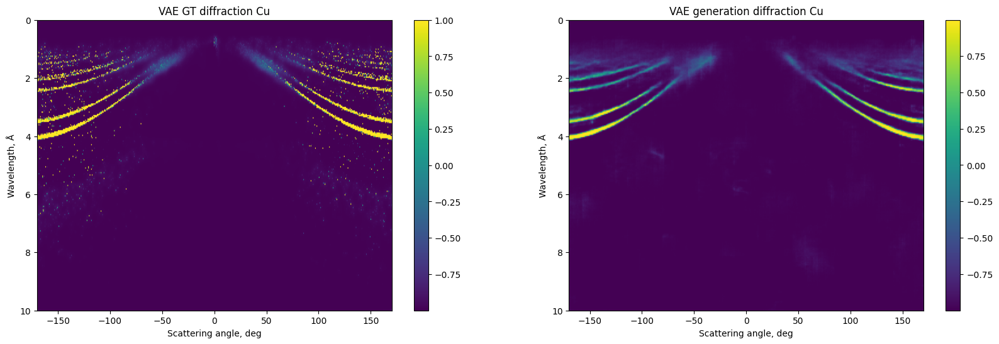

Loss: 0.0619, Recon Loss: 0.0471, KL Loss: 0.0148


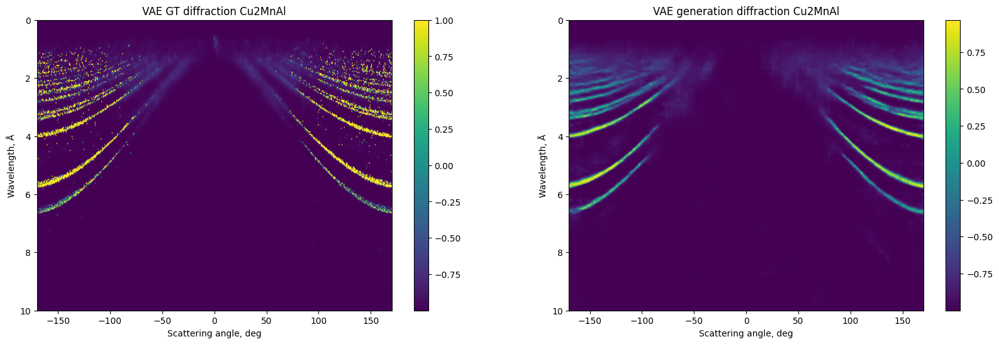

Loss: 0.0394, Recon Loss: 0.0258, KL Loss: 0.0136


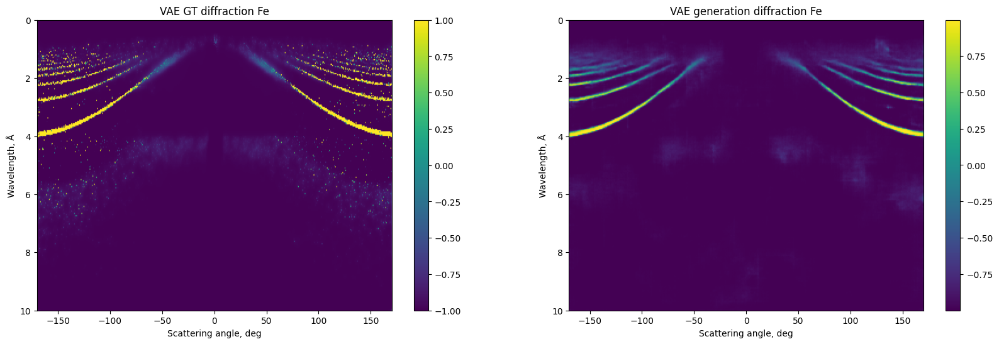

Loss: 0.0829, Recon Loss: 0.0664, KL Loss: 0.0165


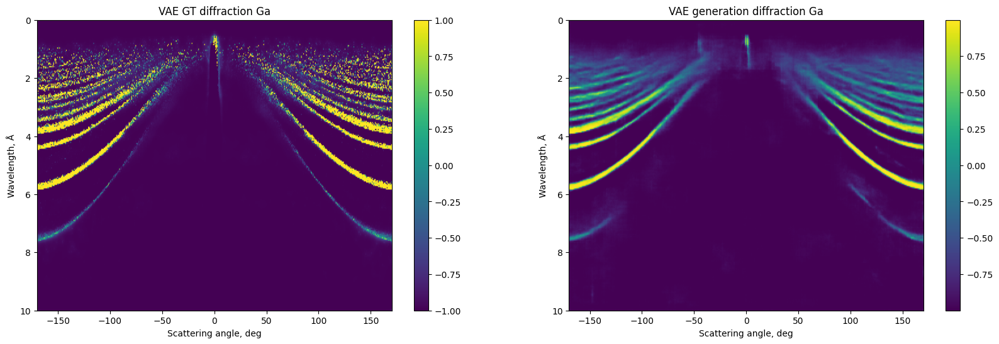

Loss: 0.0525, Recon Loss: 0.0370, KL Loss: 0.0156


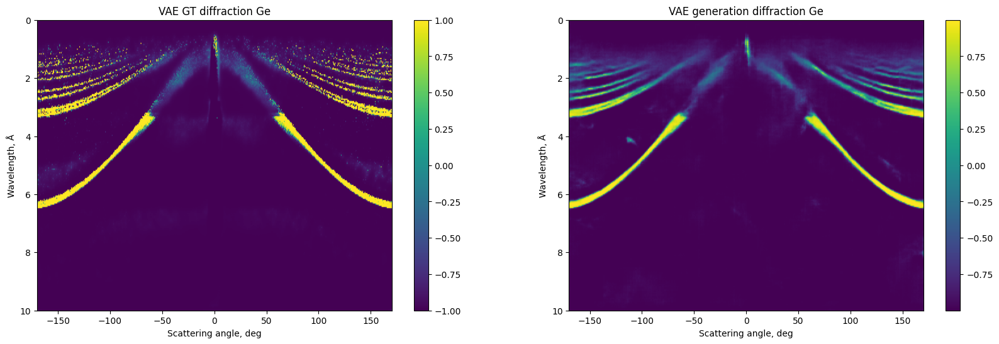

Loss: 0.0644, Recon Loss: 0.0459, KL Loss: 0.0185


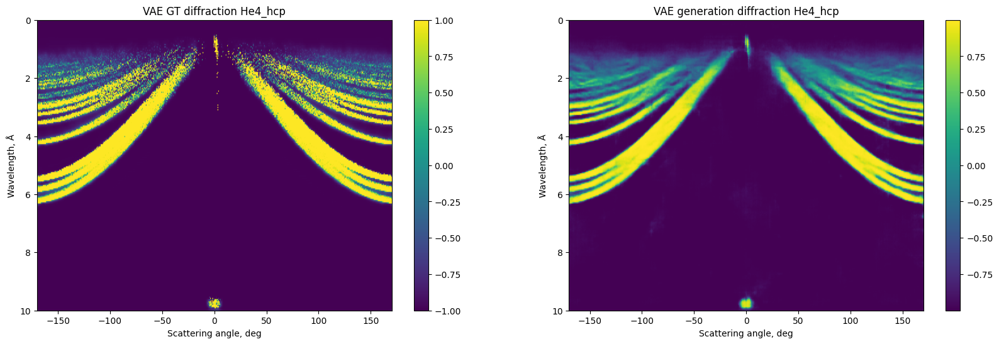

Loss: 0.0936, Recon Loss: 0.0777, KL Loss: 0.0158


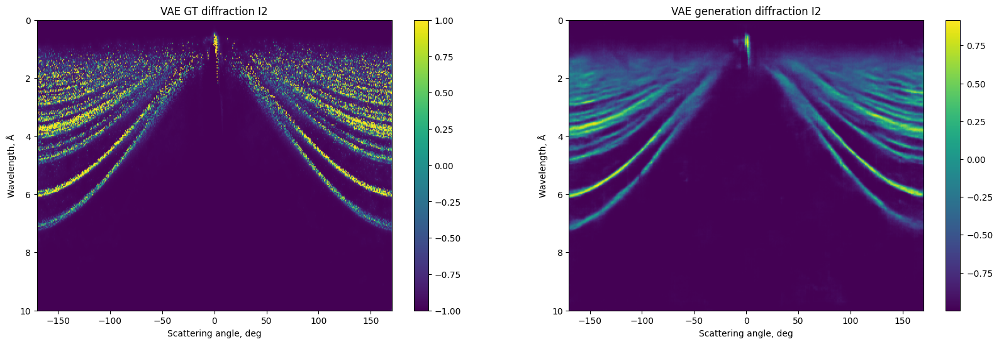

Loss: 0.1454, Recon Loss: 0.1270, KL Loss: 0.0184


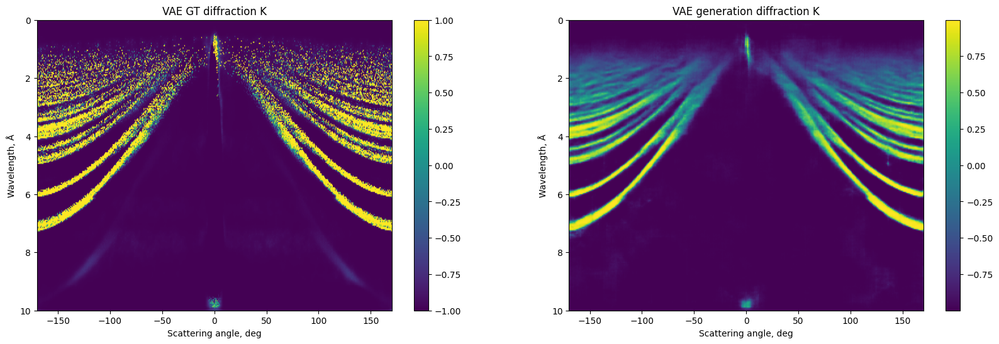

Loss: 0.0418, Recon Loss: 0.0268, KL Loss: 0.0149


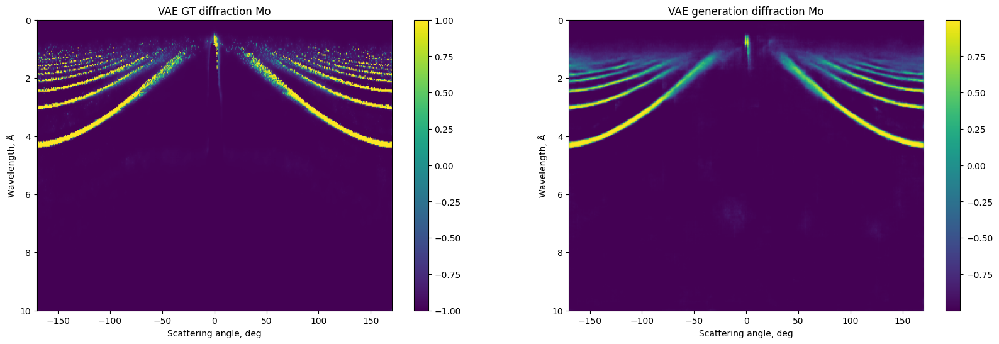

Loss: 0.1992, Recon Loss: 0.1772, KL Loss: 0.0220


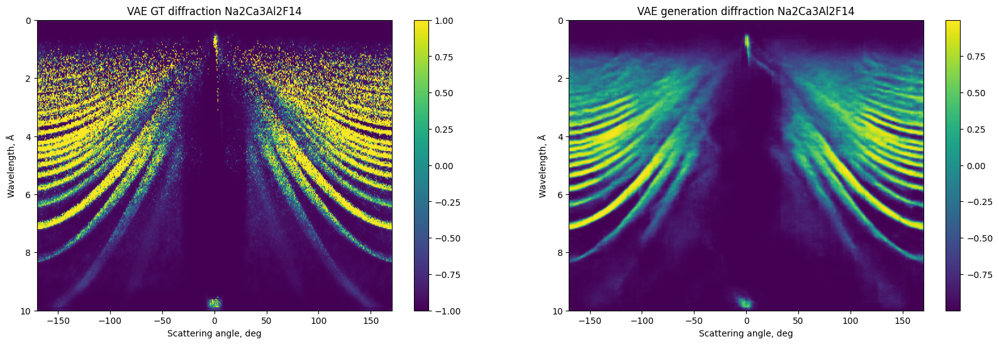

Loss: 0.0506, Recon Loss: 0.0346, KL Loss: 0.0159


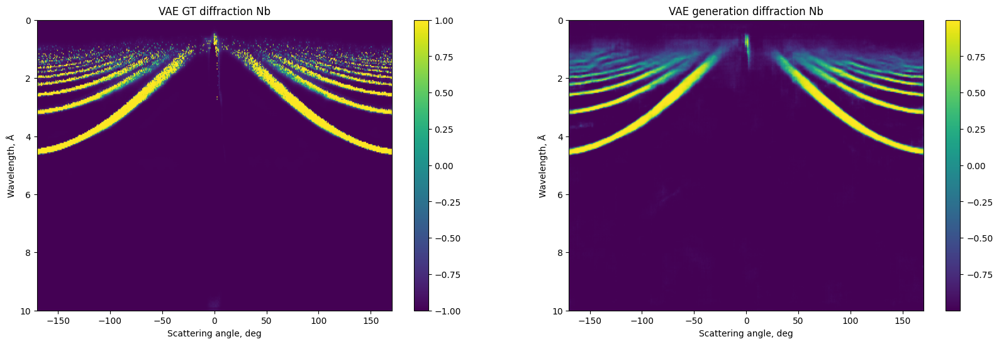

Loss: 0.0519, Recon Loss: 0.0393, KL Loss: 0.0126


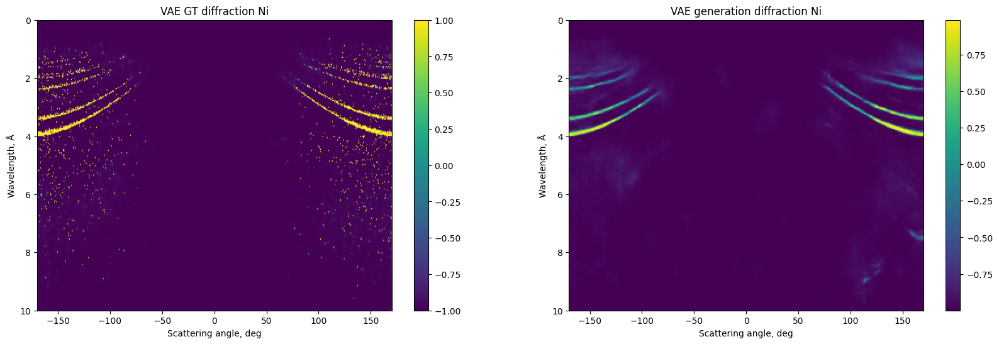

Loss: 0.0665, Recon Loss: 0.0483, KL Loss: 0.0182


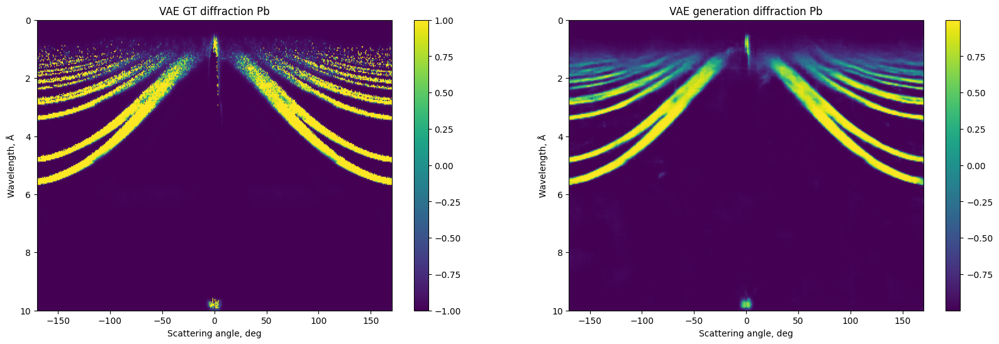

Loss: 0.0308, Recon Loss: 0.0177, KL Loss: 0.0131


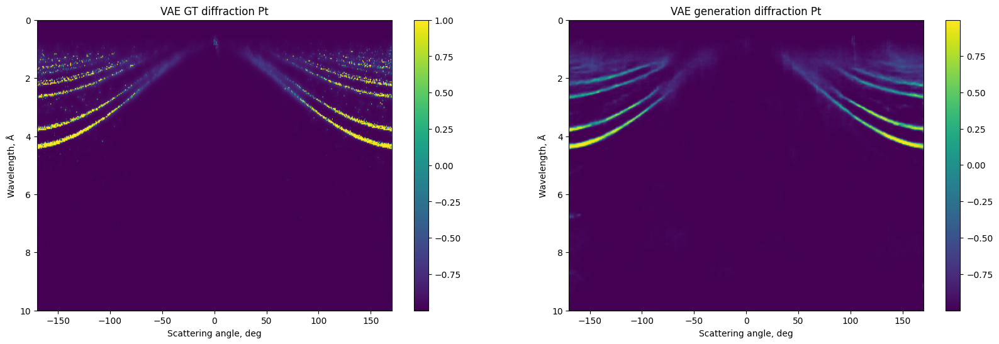

Loss: 0.1259, Recon Loss: 0.1052, KL Loss: 0.0207


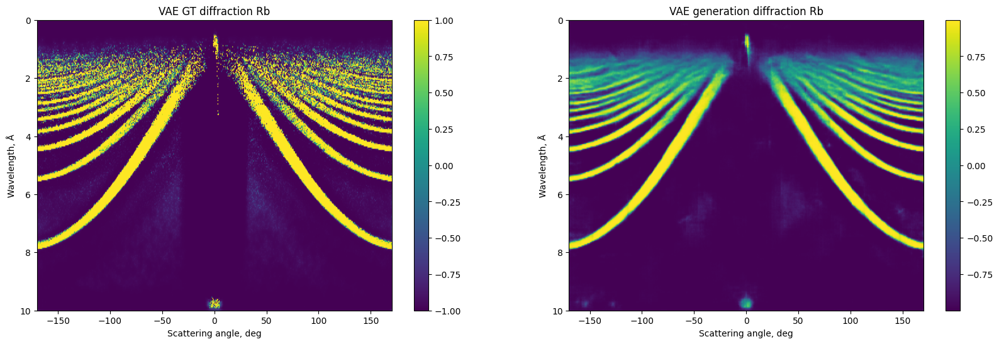

Loss: 0.0682, Recon Loss: 0.0509, KL Loss: 0.0173


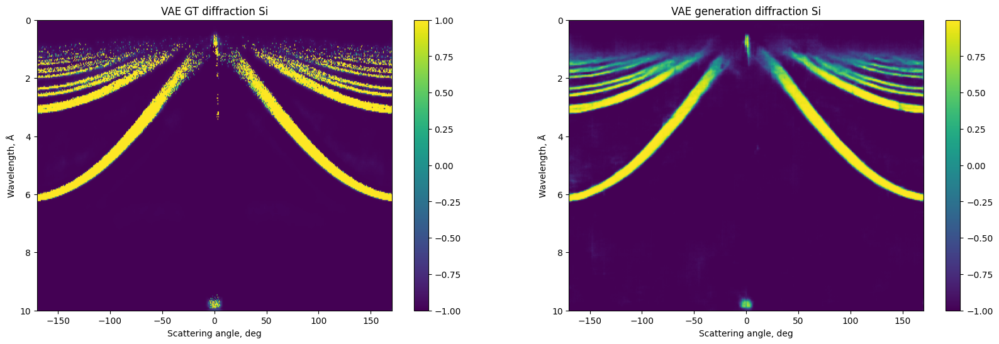

Loss: 0.0633, Recon Loss: 0.0508, KL Loss: 0.0124


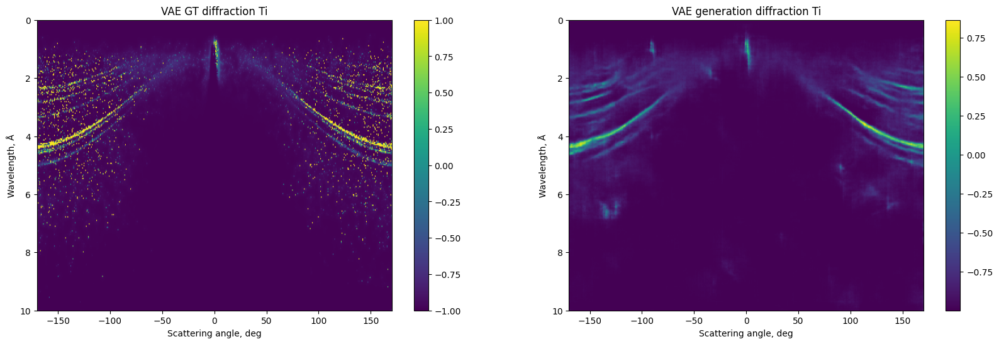

Loss: 0.0804, Recon Loss: 0.0633, KL Loss: 0.0171


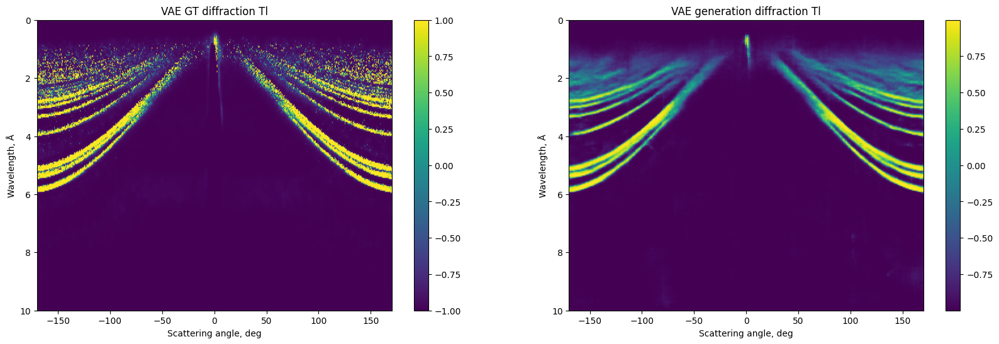

Loss: 0.0505, Recon Loss: 0.0349, KL Loss: 0.0156


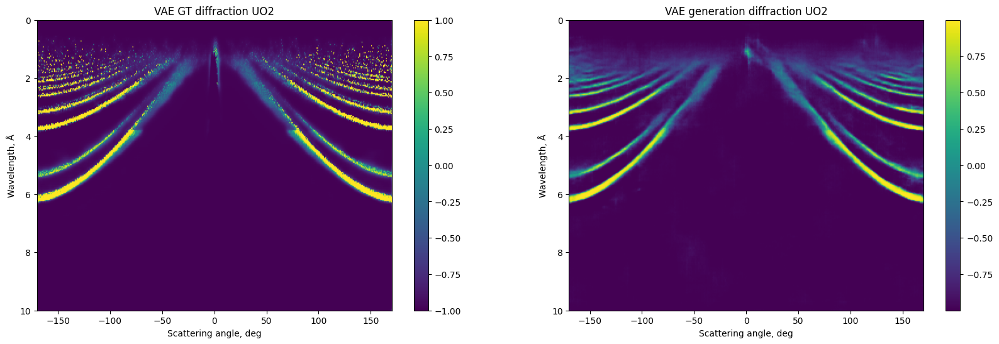

Loss: 0.0702, Recon Loss: 0.0533, KL Loss: 0.0169


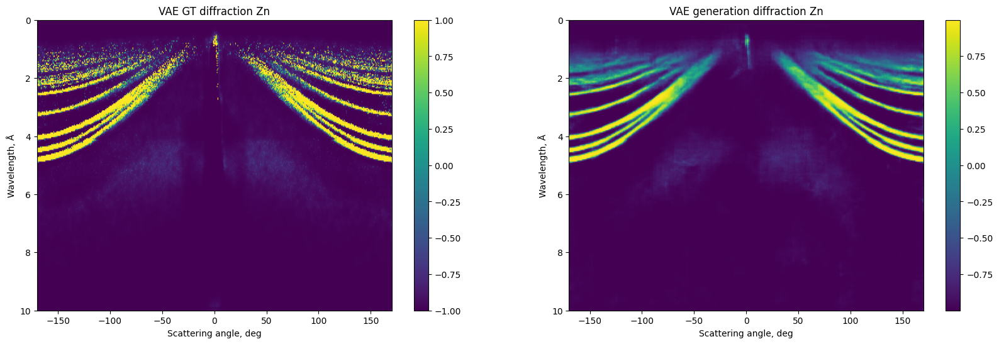

Loss: 0.1250, Recon Loss: 0.1058, KL Loss: 0.0192


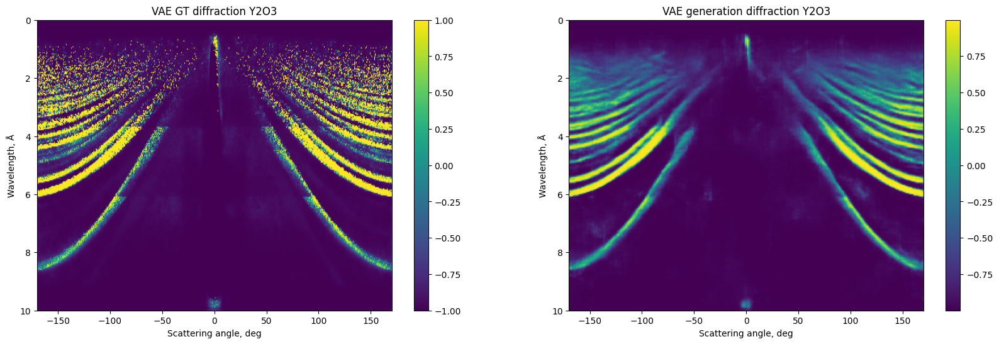

In [ ]:
val_dataset = TensorDataset(df_test_tensor, Crystal_tags_encoded)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)


with torch.no_grad():
    for batch_idx, (data, labels) in enumerate(val_loader):
        data = data.to(device)
        labels = labels.to(device)
        
        recon_data, mean, logvar = VAE(data)
        
        generated_diffractions = recon_data.squeeze().cpu().numpy()
        gt_diffractions = data.squeeze().cpu().numpy()

        # Создаем фигуру и оси
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

        # Первый график
        im1 = ax1.imshow(gt_diffractions, cmap='viridis', aspect='auto', extent=(-170, 170, 10, 0))
        ax1.set_title(f"VAE GT diffraction {Crystal_tags.tolist()[batch_idx]}")
        ax1.set_xlabel('Scattering angle, deg')
        ax1.set_ylabel('Wavelength, Å')
        plt.colorbar(im1)

        # Первый график
        im2 = ax2.imshow(generated_diffractions, cmap='viridis', aspect='auto', extent=(-170, 170, 10, 0))
        ax2.set_title(f"VAE generation diffraction {Crystal_tags.tolist()[batch_idx]}")
        ax2.set_xlabel('Scattering angle, deg')
        ax2.set_ylabel('Wavelength, Å')
        plt.colorbar(im2)

        # plt.savefig(f'VAE Results/{Crystal_tags.tolist()[i]} Diffraction VAE.jpg')

        plt.show()

# Initializing the Diffusion Transformer Model

In [21]:
from dit_model import DiffusionTransformer, CrossAttentionDiffusionTransformer

model = DiffusionTransformer(
    in_size=(25, 30),
    in_channels=32,
    patch_size=(1, 2),
    hidden_dim=512,
    depth=6,
    num_heads=8,
    num_classes=30
).to(device)

# model = CrossAttentionDiffusionTransformer(
#     in_channels=256,
#     patch_size=(1, 1),
#     hidden_dim=512,
#     depth=8,
#     num_heads=8,
#     num_classes=30
# ).to(device)

model.initialize_weights()

# Тестовые данные
sample = torch.randn(4, 32, 25, 30).to(device)
timesteps = torch.tensor([500, 300, 200, 100]).to(device)  # временные шаги
labels = torch.LongTensor([0, 1, 2, 3]).to(device)

# Проход через модель
out = model(sample, timesteps, labels)
print("Input size:", sample.size())
print("Output size:", out.size())

Input size: torch.Size([4, 32, 25, 30])
Output size: torch.Size([4, 32, 25, 30])


# Training the Diffusion Transformer model

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import math
from tqdm import tqdm

class DiffusionProcess:
    def __init__(self, beta_start=1e-4, beta_end=0.02, timesteps=1000):
        self.timesteps = timesteps
        
        # Linear noise schedule
        self.betas = torch.linspace(beta_start, beta_end, timesteps)
        self.alphas = 1. - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)
        self.alphas_cumprod_prev = F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)
        
        # Calculations for diffusion q(x_t | x_{t-1}) and others
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)
        
        # Calculations for posterior q(x_{t-1} | x_t, x_0)
        self.posterior_variance = self.betas * (1. - self.alphas_cumprod_prev) / (1. - self.alphas_cumprod)
    
    def sample_timesteps(self, batch_size, device):
        """Сэмплируем временные шаги для батча"""
        return torch.randint(0, self.timesteps, (batch_size,), device=device)
    
    def noise_latents(self, x_start, t, noise=None):
        """Добавляем шум к латентам в момент времени t"""
        if noise is None:
            noise = torch.randn_like(x_start)
        
        # Временное решение: перемещаем на устройство x_start
        sqrt_alpha_cumprod = self.sqrt_alphas_cumprod.to(x_start.device)[t].view(-1, 1, 1, 1)
        sqrt_one_minus_alpha_cumprod = self.sqrt_one_minus_alphas_cumprod.to(x_start.device)[t].view(-1, 1, 1, 1)
        
        return sqrt_alpha_cumprod * x_start + sqrt_one_minus_alpha_cumprod * noise, noise
    

def diffusion_loss(model, diffusion, x_start, class_labels):
    """Функция потерь для диффузионной модели"""
    batch_size = x_start.shape[0]
    
    # Sample random timesteps
    t = diffusion.sample_timesteps(batch_size, x_start.device)
    
    # Add noise to latents
    noisy_latents, noise = diffusion.noise_latents(x_start, t)
    
    # Predict noise
    pred_noise = model(noisy_latents, t, class_labels)
    
    # Simple MSE loss
    loss = F.mse_loss(pred_noise, noise)
    
    return loss

In [23]:
class DiffusionTrainer:
    def __init__(self, model, VAE, diffusion, train_loader, val_loader, optimizer, device):
        self.model = model
        self.VAE = VAE
        self.diffusion = diffusion
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.optimizer = optimizer
        self.device = device
        
    def train_epoch(self):
        self.model.train()
        self.VAE.eval()  # VAE в eval режиме
        total_loss = 0
        
        pbar = tqdm(self.train_loader, desc="Training")
        for batch_idx, (diffractions, classes) in enumerate(pbar):
            diffractions = diffractions.to(self.device)
            classes = classes.to(self.device)

            with torch.no_grad():
                latent_maps, _, _ = self.VAE.encode(diffractions, classes)
            
            self.optimizer.zero_grad()
            
            loss = diffusion_loss(self.model, self.diffusion, latent_maps, classes)
            loss.backward()
            self.optimizer.step()
            
            total_loss += loss.item()
            pbar.set_postfix({'loss': f'{loss.item():.4f}'})
        
        return total_loss / len(self.train_loader)
    
    def validate(self):
        self.model.eval()
        self.VAE.eval()  # VAE в eval режиме
        total_loss = 0
        
        with torch.no_grad():
            for diffractions, classes in self.val_loader:
                diffractions = diffractions.to(self.device)
                classes = classes.to(self.device)

                latent_maps, _, _ = self.VAE.encode(diffractions, classes)
                
                loss = diffusion_loss(self.model, self.diffusion, latent_maps, classes)
                total_loss += loss.item()
        
        return total_loss / len(self.val_loader)
    
    def train(self, epochs, save_path='diffusion_model.pth'):
        best_val_loss = float('inf')
        
        for epoch in range(epochs):
            print(f'\nEpoch {epoch+1}/{epochs}')
            
            train_loss = self.train_epoch()
            # val_loss = self.validate()
            
            # print(f'Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}')
            # Исправленная строка вывода
            print(f'Train Loss: {train_loss:.4f}')

In [24]:
# Диффузионный процесс
diffusion = DiffusionProcess(timesteps=700)

# Оптимизатор
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=1e-4,
    weight_decay=1e-4,
    betas=(0.9, 0.95)
)

# Планировщик learning rate
# scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
#     optimizer, T_max=100, eta_min=1e-6
# )

# Тренер
trainer = DiffusionTrainer(
    model=model,
    VAE = VAE,
    diffusion=diffusion,
    train_loader=train_loader,
    val_loader=None,
    optimizer=optimizer,
    device=device
)

# Обучение
print("Starting training...")
trainer.train(epochs=100, save_path='best_diffusion_model.pth')

Starting training...

Epoch 1/100


Training: 100%|██████████| 162/162 [00:18<00:00,  8.90it/s, loss=0.6737]


Train Loss: 0.7540

Epoch 2/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.39it/s, loss=0.4446]


Train Loss: 0.3633

Epoch 3/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.27it/s, loss=0.2399]


Train Loss: 0.3371

Epoch 4/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.28it/s, loss=0.2233]


Train Loss: 0.3256

Epoch 5/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.21it/s, loss=0.3437]


Train Loss: 0.3203

Epoch 6/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.37it/s, loss=0.2641]


Train Loss: 0.3409

Epoch 7/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.19it/s, loss=0.2760]


Train Loss: 0.3410

Epoch 8/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.34it/s, loss=0.2570]


Train Loss: 0.3290

Epoch 9/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.38it/s, loss=0.4191]


Train Loss: 0.3235

Epoch 10/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.2621]


Train Loss: 0.3431

Epoch 11/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.35it/s, loss=0.4082]


Train Loss: 0.3229

Epoch 12/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.4870]


Train Loss: 0.3330

Epoch 13/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.30it/s, loss=0.1839]


Train Loss: 0.3267

Epoch 14/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.2749]


Train Loss: 0.3307

Epoch 15/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.24it/s, loss=0.3923]


Train Loss: 0.3318

Epoch 16/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.29it/s, loss=0.2754]


Train Loss: 0.3235

Epoch 17/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.14it/s, loss=0.2661]


Train Loss: 0.3349

Epoch 18/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.2939]


Train Loss: 0.3307

Epoch 19/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.32it/s, loss=0.3405]


Train Loss: 0.3266

Epoch 20/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.34it/s, loss=0.2482]


Train Loss: 0.3253

Epoch 21/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.25it/s, loss=0.4091]


Train Loss: 0.3228

Epoch 22/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.35it/s, loss=0.3016]


Train Loss: 0.3339

Epoch 23/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.36it/s, loss=0.2014]


Train Loss: 0.3150

Epoch 24/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.4432]


Train Loss: 0.3292

Epoch 25/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.31it/s, loss=0.3328]


Train Loss: 0.3288

Epoch 26/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.30it/s, loss=0.3533]


Train Loss: 0.3465

Epoch 27/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.23it/s, loss=0.3033]


Train Loss: 0.3369

Epoch 28/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.36it/s, loss=0.1623]


Train Loss: 0.3275

Epoch 29/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.35it/s, loss=0.1944]


Train Loss: 0.3306

Epoch 30/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.35it/s, loss=0.5393]


Train Loss: 0.3318

Epoch 31/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.31it/s, loss=0.1863]


Train Loss: 0.3292

Epoch 32/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.33it/s, loss=0.3961]


Train Loss: 0.3272

Epoch 33/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.28it/s, loss=0.4253]


Train Loss: 0.3468

Epoch 34/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.1458]


Train Loss: 0.3229

Epoch 35/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.27it/s, loss=0.1971]


Train Loss: 0.3271

Epoch 36/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.31it/s, loss=0.4641]


Train Loss: 0.3392

Epoch 37/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.64it/s, loss=0.3488]


Train Loss: 0.3324

Epoch 38/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.77it/s, loss=0.3409]


Train Loss: 0.3217

Epoch 39/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.78it/s, loss=0.3866]


Train Loss: 0.3302

Epoch 40/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.76it/s, loss=0.3679]


Train Loss: 0.3418

Epoch 41/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.78it/s, loss=0.2663]


Train Loss: 0.3173

Epoch 42/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.77it/s, loss=0.2918]


Train Loss: 0.3335

Epoch 43/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.75it/s, loss=0.1884]


Train Loss: 0.3292

Epoch 44/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.77it/s, loss=0.4427]


Train Loss: 0.3243

Epoch 45/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.75it/s, loss=0.4035]


Train Loss: 0.3319

Epoch 46/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.37it/s, loss=0.3938]


Train Loss: 0.3269

Epoch 47/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.22it/s, loss=0.4600]


Train Loss: 0.3217

Epoch 48/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.19it/s, loss=0.4572]


Train Loss: 0.3479

Epoch 49/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.20it/s, loss=0.2071]


Train Loss: 0.3323

Epoch 50/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.29it/s, loss=0.3998]


Train Loss: 0.3244

Epoch 51/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.31it/s, loss=0.2839]


Train Loss: 0.3366

Epoch 52/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.27it/s, loss=0.2363]


Train Loss: 0.3150

Epoch 53/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.25it/s, loss=0.3722]


Train Loss: 0.3376

Epoch 54/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.20it/s, loss=0.2245]


Train Loss: 0.3290

Epoch 55/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.28it/s, loss=0.3380]


Train Loss: 0.3254

Epoch 56/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.08it/s, loss=0.5759]


Train Loss: 0.3381

Epoch 57/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.28it/s, loss=0.6056]


Train Loss: 0.3177

Epoch 58/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.29it/s, loss=0.1770]


Train Loss: 0.3134

Epoch 59/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.35it/s, loss=0.4693]


Train Loss: 0.3282

Epoch 60/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.4231]


Train Loss: 0.3306

Epoch 61/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.29it/s, loss=0.1477]


Train Loss: 0.3279

Epoch 62/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.33it/s, loss=0.2566]


Train Loss: 0.3244

Epoch 63/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.28it/s, loss=0.5168]


Train Loss: 0.3262

Epoch 64/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.32it/s, loss=0.4701]


Train Loss: 0.3369

Epoch 65/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.32it/s, loss=0.3274]


Train Loss: 0.3243

Epoch 66/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.22it/s, loss=0.1910]


Train Loss: 0.3286

Epoch 67/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.20it/s, loss=0.2957]


Train Loss: 0.3395

Epoch 68/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.22it/s, loss=0.4636]


Train Loss: 0.3157

Epoch 69/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.26it/s, loss=0.3270]


Train Loss: 0.3284

Epoch 70/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.35it/s, loss=0.4210]


Train Loss: 0.3315

Epoch 71/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.22it/s, loss=0.4604]


Train Loss: 0.3358

Epoch 72/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.23it/s, loss=0.3749]


Train Loss: 0.3202

Epoch 73/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.27it/s, loss=0.3191]


Train Loss: 0.3230

Epoch 74/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.41it/s, loss=0.2124]


Train Loss: 0.3265

Epoch 75/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.49it/s, loss=0.1800]


Train Loss: 0.3228

Epoch 76/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.33it/s, loss=0.2431]


Train Loss: 0.3200

Epoch 77/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.30it/s, loss=0.2584]


Train Loss: 0.3241

Epoch 78/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.40it/s, loss=0.4449]


Train Loss: 0.3242

Epoch 79/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.30it/s, loss=0.2450]


Train Loss: 0.3229

Epoch 80/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.20it/s, loss=0.2898]


Train Loss: 0.3212

Epoch 81/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.41it/s, loss=0.2811]


Train Loss: 0.3373

Epoch 82/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.45it/s, loss=0.0749]


Train Loss: 0.3240

Epoch 83/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.40it/s, loss=0.2560]


Train Loss: 0.3251

Epoch 84/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.46it/s, loss=0.4970]


Train Loss: 0.3213

Epoch 85/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.42it/s, loss=0.3410]


Train Loss: 0.3246

Epoch 86/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.44it/s, loss=0.3240]


Train Loss: 0.3287

Epoch 87/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.46it/s, loss=0.2210]


Train Loss: 0.3475

Epoch 88/100


Training: 100%|██████████| 162/162 [00:16<00:00,  9.54it/s, loss=0.2068]


Train Loss: 0.3236

Epoch 89/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.49it/s, loss=0.3520]


Train Loss: 0.3342

Epoch 90/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.48it/s, loss=0.2350]


Train Loss: 0.3269

Epoch 91/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.50it/s, loss=0.2601]


Train Loss: 0.3125

Epoch 92/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.46it/s, loss=0.3827]


Train Loss: 0.3248

Epoch 93/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.15it/s, loss=0.0167]


Train Loss: 0.3175

Epoch 94/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.50it/s, loss=0.2772]


Train Loss: 0.3337

Epoch 95/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.46it/s, loss=0.4943]


Train Loss: 0.3256

Epoch 96/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.50it/s, loss=0.2727]


Train Loss: 0.3386

Epoch 97/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.52it/s, loss=0.4634]


Train Loss: 0.3369

Epoch 98/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.29it/s, loss=0.4896]


Train Loss: 0.3246

Epoch 99/100


Training: 100%|██████████| 162/162 [00:17<00:00,  9.34it/s, loss=0.3376]


Train Loss: 0.3244

Epoch 100/100


Training: 100%|██████████| 162/162 [00:18<00:00,  8.95it/s, loss=0.1770]

Train Loss: 0.3085


In [16]:
def plot_grad_flow(named_parameters):
    ave_grads = []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.abs().mean().cpu())
    plt.figure(figsize=(20, 6))
    plt.plot(ave_grads, alpha=0.3, color="b")
    plt.yscale('log')
    plt.hlines(0, 0, len(ave_grads)+1, linewidth=1, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(ave_grads))
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)

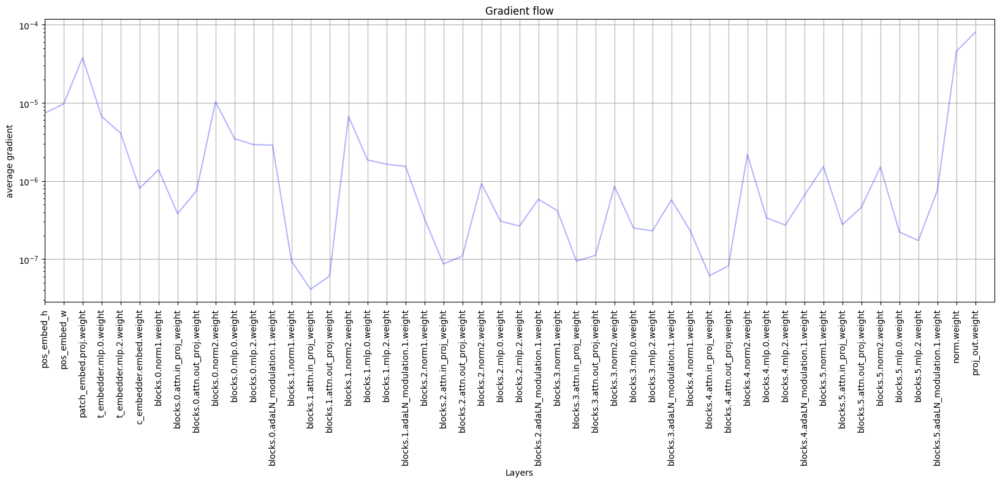

In [17]:
plot_grad_flow(model.named_parameters())